<div style="border:solid green 2px; padding: 20px">
    
<b>Антон, привет!</b> Мы рады тебя видеть на территории код-ревьюеров. 😎 Ты проделал большую работу над проектом, но давай познакомимся и сделаем его еще лучше! У нас тут своя атмосфера и несколько правил:


1. Меня зовут Александр Матвеевский. Я работаю код-ревьюером, моя основная цель — не указать на совершенные тобою ошибки, а поделиться своим опытом и помочь тебе стать аналитиком данных.
2. Общаемся на ты.
3. Если хочешь написать, спросить - не нужно стесняться. Только выбери свой цвет для комментария.  
4. Это учебный проект, тут можно не бояться сделать ошибку.  
5. У нас с тобой 6 попыток для сдачи проекта   
6. Let's Go!

---

Я буду красить комментарии цветом, пожалуйста, не удаляй их:

<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №1__

Такой комментарий нужно исправить обязательно, он критически влияет на удачное выполнение проекта.
</div>
    
---

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__


Такой комментарий является рекомендацией или советом. Можешь использовать их на своё усмотрение.
</div>

---

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Такой комментарий  говорит о том, что было сделано что-то качественное и правильное =)
</div>
    
---
    
Предлагаю работать над проектом в диалоге: если ты что-то меняешь в проекте или отвечаешь на мои комментарии — пиши об этом. Мне будет легче отследить изменения, если ты выделишь свои комментарии:   
    
<div class="alert alert-info"> <b>Комментарии студента:</b> Например, вот так.</div>
    
Всё это поможет выполнить повторную проверку твоего проекта оперативнее. Если будут какие-нибудь вопросы по моим комментариям, пиши, будем разбираться вместе :)    
    
---

## Исследование рынка заведений общественного питания Москвы

Это исследование заведений общественного питания Москвы для инвесторы из фонда «Shut Up and Take My Money», которые решили открыть заведение общественного питания в Москве. Для прянития решения, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены от аналитика требудется подготовить исследование рынка Москвы.

**Цели исследования**

- Выявить интересные особенности заведений общественного питания Москвы
- Детально проанализировать перспективы откртытия кофейни 
- Дать рекомендации для открытия нового заведения 

**Ход исследования**

Данные составленны на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. О качестве данных ничего не известно, поэтому перед основным исследованием потребуется провести обзор данных. Надо проверить даные на пропуски, дубликаты и аномалии. Если они есть, надо найти возможность исправить некорректные данные, либо отфильтровать их. 

В ходе исследования требудется выявить особенности в категориях и типах заведений общественного питания, вместимости клиентов, режиме работы, распределении их географического расположении по округам Москвы, а также закономерностях формирования средних чеков. 

Таким образом, исследоваание будет состоять из четырех этапов:

- Загрузка данных и подготовка данных к анализу
- Исследовательский анализ данных
- Детальный анализ данных по кофейням
- Общий вывод

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__


Отличная практика - расписывать цель и основные этапы своими словами (этот навык очень поможет на фильнальном проекте).
</div>

## Загрузка данных

In [1]:
import pandas as pd
import math
import matplotlib.pyplot as plt
import seaborn as sns
import json
from folium import Map, Choropleth, Marker, plugins, branca
from folium.plugins import MarkerCluster, HeatMap

In [2]:
pd.set_option('display.float_format', '{:.2f}'.format)
pd.set_option('display.precision', 2)
plt.rcParams ['figure.figsize'] = [15, 8]

In [3]:
try: 
    data = pd.read_csv('d:/practicum/11sprint/moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в датасете почти 8,5 тысяч записей о заведениях. Переименовывать колонки нет необходимости.

- Столбцы lat, lng, rating,  middle_avg_bill, middle_coffee_cup, seats - содержат числовые значения типа float.
- Столбец seats - количество посадочных мест - по описанию должен быть целочисленным. Однако в столбце есть пропуски и перевести его в int можно только с заменой пропусков на 0, что не корректно. Оставлим значения столбца как есть.
- Столбец chain имеет тип int64, но по описанию должен быть булевым, но можно оставить и так.
- Столбцы name, category, address, district, hours, price, avg_bill - имеют тип object и содержат информацию разных типов, оставим значения как есть.

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Промежуточный вывод**

Загрузили данные из датасета. Назавания колонок не требуют изменений. В датасете содержатся данные разных типов. Необходимости преобразовывать столбцы к определенному типу данных нет.

<div class="alert alert-block alert-success">✔️
    
__Комментарий от ревьюера №1__
    
Отлично! Первый взгляд на данные есть

## Предобработка данных

### Дубликаты

Проверим датасет на полные дубликаты

In [7]:
data.duplicated().sum()

0

Полных дубликатов - нет

Проверим датасет на дубликаты только в полях name и address

In [8]:
data[['name', 'address']].duplicated().sum()

0

Дубликатов по названию и адресу - нет.

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__

Но есть один нюанс. Если мы приведем названия заведения к единой форме, то увидим интересные результаты
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Имеется ввиду, что в названиях есть и категории, если их очистить появятся дубликаты?</div>

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №2__

Имеется вииду столбцы `name` и `address` привести к единой форме (применить метод `str.lower()` )

In [71]:
data[data[['name', 'address']].apply(lambda col: col.str.lower()).replace({',':' ', '`': '', '\'': ' ', '  ': ' ', 'ё': 'е'}).duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,distr
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,0,NaN,парк Ангарские пруды,False,САО
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.81,37.50,4.20,NaN,NaN,NaN,NaN,1,188.00,Волоколамское шоссе,False,САО
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.81,37.64,4.40,NaN,NaN,NaN,NaN,1,150.00,проспект Мира,False,СВАО
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,0,276.00,Ярцевская улица,False,ЗАО


### Пропуски по колонкам

In [10]:
na_data = pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm')
na_data

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Пропуски есть в колоноках price, avg_bill, middle_avg_bill, middle_coffee_cup и seats. Кроме последенй все они финансовые, касаюстя стоимости услуг. Также пропуски есть в колонке посадочных мест.

Эти пропуски восстановить никак нельзя. Отбросить их тоже нельзя, так как пропуски его значительном количестве записей. Оставляем пропусти как есть.

### Новые колонки

Создадим столбец street с названиями улиц, взятых из столбца с адресом. Создадим столбец is_24_7 булевского типа, который оззначает, что заведение работает ежедневно и круглосуточно

In [11]:
data['street'] = data['address'].apply(lambda x: x.split(", ")[1])
data['is_24_7'] = data['hours'].astype('str').apply(lambda x: 'ежедневно, круглосуточно' in x)

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Здорово, что используешь регулярные выражения
</div>

Создадим столбец dist с коротким названием округа

In [12]:
data['distr'] = data['district'].replace(regex='административный округ', value='АО').replace(regex='[а-я -]', value='')

Проверяем полученные колонки

In [13]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,distr
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False,САО
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица Дыбенко,False,САО
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,Клязьминская улица,False,САО
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко,False,САО
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,Правобережная улица,False,САО


**Промежуточный вывод**

В данных нет дубликатов. Зато есть пропуски в данных, которые как-либо восстановить не представляется возможным. Просто удалить пропуски нельзя, так как потеряется другая важная информация. Оставляем пропусти как есть.

## Анализ данных

### Категории заведений

Исследуем, какие категории заведений общественного питания есть в детасете, сколько заведений входит в каждую из них, и какую долю рынка занимают заведения каждой ктегории.

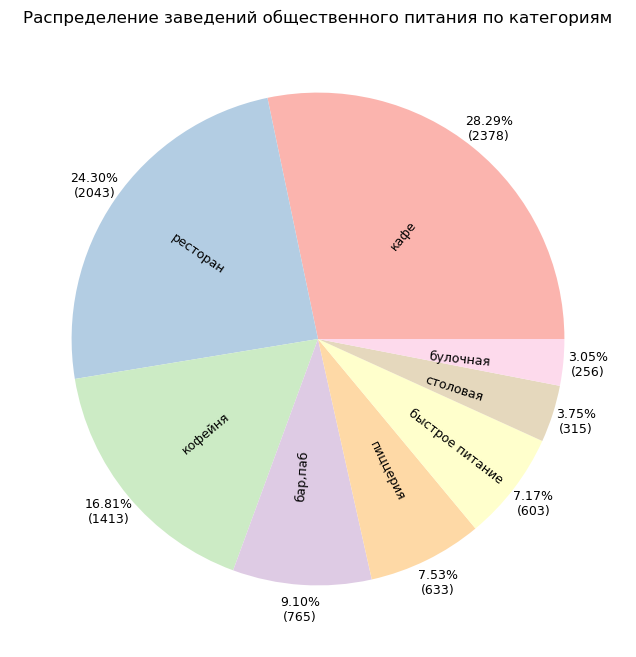

In [14]:
data.groupby('category')['address'].count().sort_values(ascending=False).plot.pie(ylabel='',
        colors=sns.color_palette('Pastel1'),
        textprops={'fontsize': 9},
        rotatelabels=True,
        pctdistance=1.1,  labeldistance=0.45,
        autopct=lambda p : '{:.2f}%\n({:.0f})'.format(p, p * len(data)/100))                                                                          
plt.title('Распределение заведений общественного питания по категориям')
plt.show()

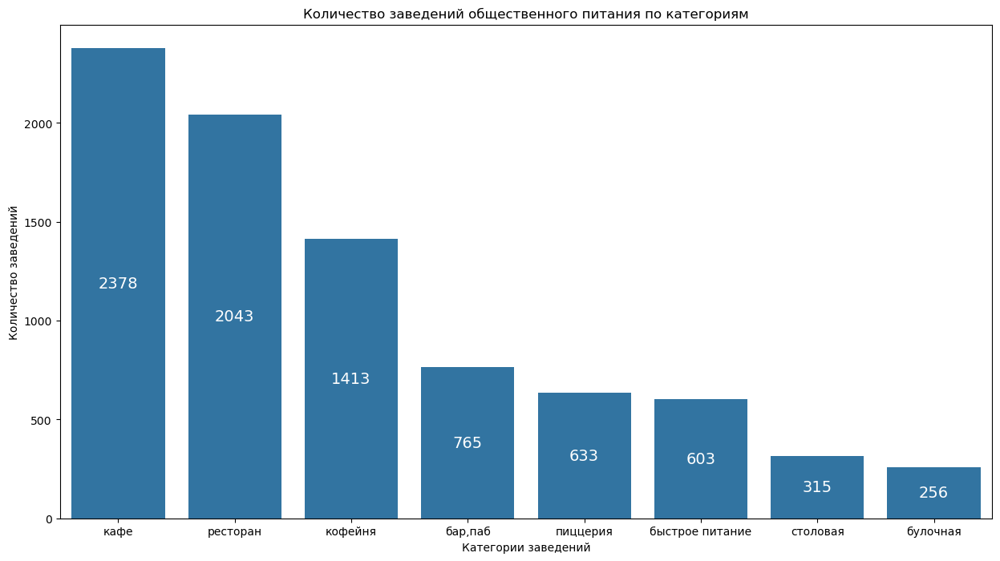

In [15]:
ax = sns.barplot(data = data.groupby('category', as_index=False)['name'].count().sort_values(by='name', ascending=False)
                 , y="name", x="category", color="tab:blue")
ax.bar_label(ax.containers[0], fontsize=14,label_type='center', color='white')
plt.title('Количество заведений общественного питания по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категории заведений')
plt.show()

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Отличный и наглядный график 👍
    
Здорово, когда он подписан. Так быстрее понять о чем идёт речь на нём.
    
</div>

*в яндекс.практикуме старая версия python, в которой bar_label не поддерживается, а с ними графики информативнее. в презентации можно посмотреть. пока просто закоментировал эту строчку*

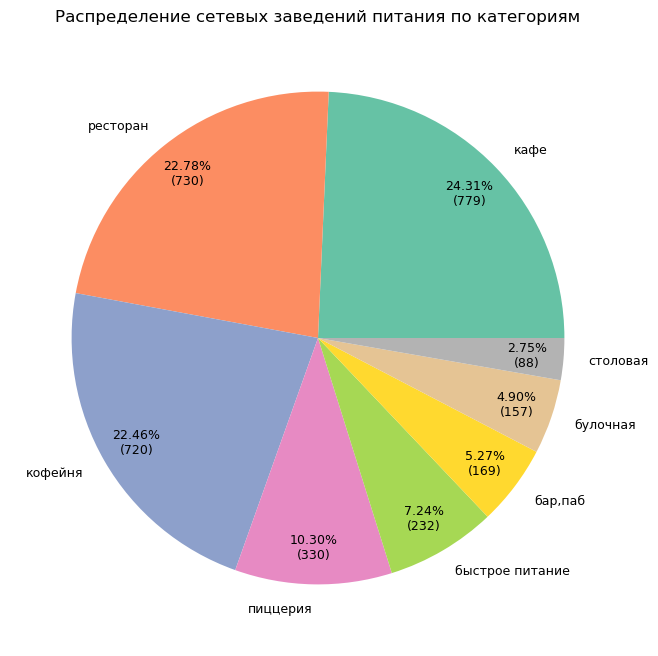

In [16]:
data.query('chain == 1').groupby('category')['address'].count().sort_values(ascending=False).plot.pie(ylabel='',
            #autopct='%1.1f%%',
            colors=sns.color_palette('Set2'),
            textprops={'fontsize': 9},
            pctdistance=0.85,  labeldistance=1.1,
            autopct=lambda p : '{:.2f}%\n({:,.0f})'.format(p, p * len(data.query('chain == 1'))/100))
plt.title('Распределение сетевых заведений питания по категориям')
plt.show()

In [17]:
proc = round(100 * data.groupby('category')['address'].count() / len(data), 2)
proc = pd.DataFrame({'cat':proc.index, 'proc':proc.values})

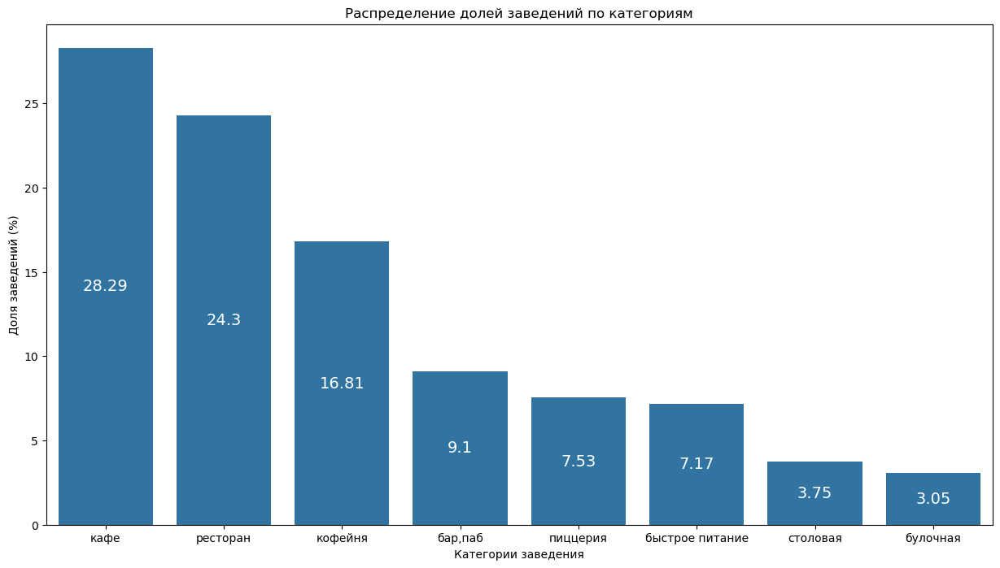

In [18]:
ax = sns.barplot(data=proc.sort_values(by='proc', ascending=False), 
            x='cat', y='proc', color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=14,label_type='center', color='white')
plt.title('Распределение долей заведений по категориям')
plt.ylabel('Доля заведений (%)')
plt.xlabel('Категории заведения')
plt.show()

<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №1__

При таком количестве категорий данный вид графика будет сложным к восприятию (круговая диаграмма информативна в принципе тогда, когда есть подписаны доли, подписаны значения, соответственно ставится вопрос зачем нужна круговая диаграмма, если нужно всё подписывать). `Поправь, пожалуйста, этот момент во всем проекте`. Что каждый раз на этом не акцентировать внимание
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Пределал
    
Но по мне - все прекрасно читается. Да, и можно не подписывать проценты/значения.
    
Если править этот момент во всем проекте, то круговая диаграмма останется только на сетевые/несетевые, а в других местах будут только столбчатые, как самые универсальные. Круговую диаграмму можно применить, там где есть доли от целого. На рейтинг или средний чек круговую уже не поставишь...</div>

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

«У секторной диаграммы очень много недостатков. Во-первых, человеческий глаз не может нормально сравнить длину дуги окружности, поскольку секторы направлены в различные стороны. Во-вторых, человеческое зрение не приспособлено к сравнению углов в принципе…

Наконец, невозможно эффективно оценить величину областей, особенно если они представлены в виде неравномерных секторов в круге. Не существует способа, который бы позволял сравнивать компоненты круглой фигуры так же быстро и точно, как части прямой линии или столбца»

Карл Густав Карстен, 1923 год

В датасете 8 категории: булочная, столовая, быстрое питание, пиццерия, бар,паб, кофейня, ресторан, кафе. Наиболее распространенны - кафе, ресторан, кофейня. Меньше всего столовых и булочных.

### Посадочные места

Исследуем количество посадочных мест, характерное для завдеений общественного питания Москвы различных категории

In [19]:
data['seats'].describe()

count   4795.00
mean     108.42
std      122.83
min        0.00
25%       40.00
50%       75.00
75%      140.00
max     1288.00
Name: seats, dtype: float64

В датасете в колонке seat 43% пропусков, а имеющиеся значения варьируются от 0 до 1288. 1300 мест, пожалуй, слишком много даже для футкорда в большом торговом центре. То есть имеется аномальные значения. Для оценки лучше взять медианные значения, и отсечь аномалии, хотя бы на графиках

Распредение посадочных мест в зависимости от категории заведений общественного питания

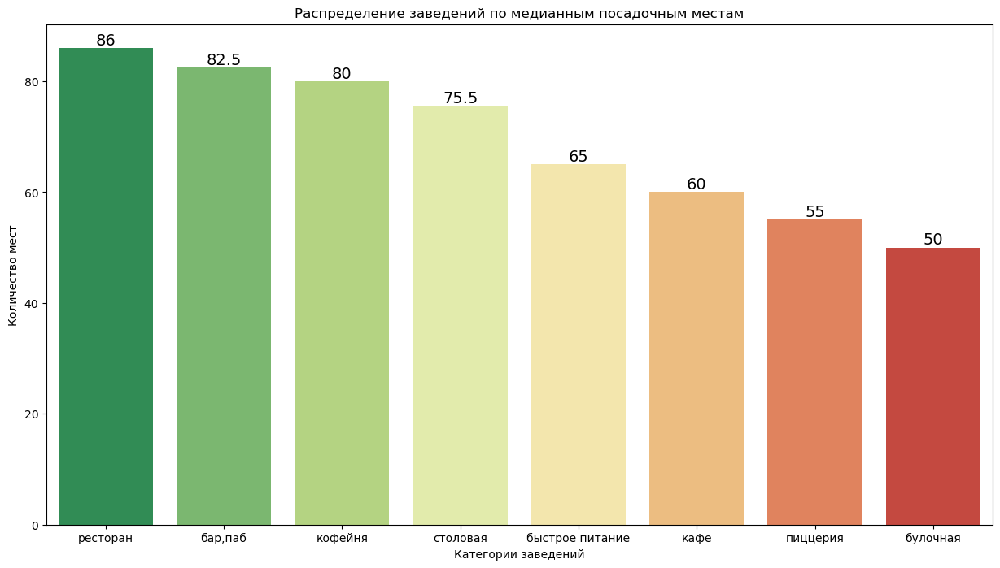

In [66]:
ax = sns.barplot(data=data.groupby('category', as_index=False)['seats'].median().sort_values(by='seats', ascending=False), 
            x='category', y='seats', palette='RdYlGn_r')
ax.bar_label(ax.containers[0], fontsize=14,label_type='edge', color='black')
plt.title('Распределение заведений по медианным посадочным местам')
plt.ylabel('Количество мест')
plt.xlabel('Категории заведений')
plt.show()

Самые вместительное рестораня, бары и кофейни. В булочных меньше всего посадочных мест.

In [21]:
data.groupby('category')['seats'].median().mean()

69.25

В среднем в заведениях общественного питания всех категорий около 70 посадочных мест

<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №1__

В этом пункте требуется построить столбчатую диаграмму с медианой пасодочных мест по категориям (1 диаграмму)

<div class="alert alert-info"> <b>Комментарии студента:</b> Переделал</div>

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Да, больше всего посадочных мест у ресторанов, а меньше у булочных. Что вполне закономерно
</div>

### Сетевые / несетевые заведения

Исследуем соотношение сетевых и несетевых заведений общественного питания в Москве

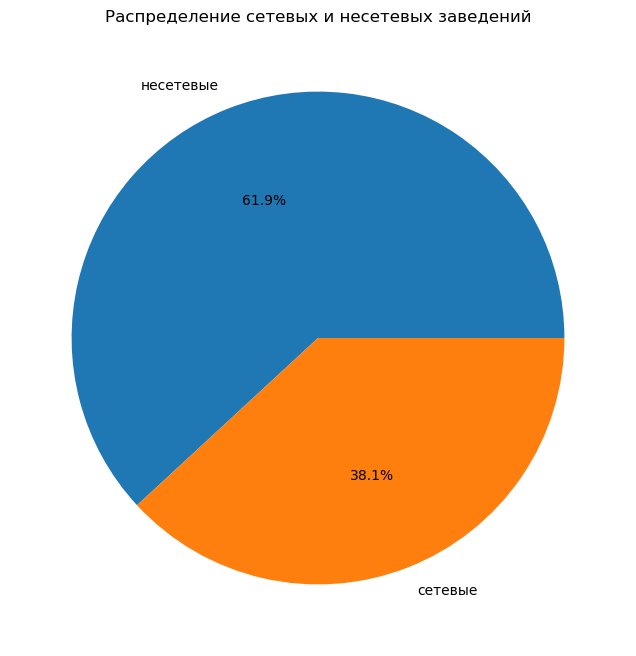

In [22]:
data.groupby('chain')['address'].count().plot.pie(ylabel='', labels = ['несетевые', 'сетевые'], autopct='%1.1f%%')
plt.title('Распределение сетевых и несетевых заведений')
plt.show()

Несетевых заведений больше, чем сетевых, соотношение 60 на 40

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Не сетевых заведений, как и ожидалось больше
</div>

### Категории сетевых заведений

Исследуем, какие категории заведений общественного питания чаще всего являются сетевыми

In [23]:
seti_proc = round(100 * data.query('chain == 1').groupby('category')['address'].count() / 
                  data.groupby('category')['address'].count(),2)
seti_proc = pd.DataFrame({'cat':seti_proc.index, 'proc':seti_proc.values})

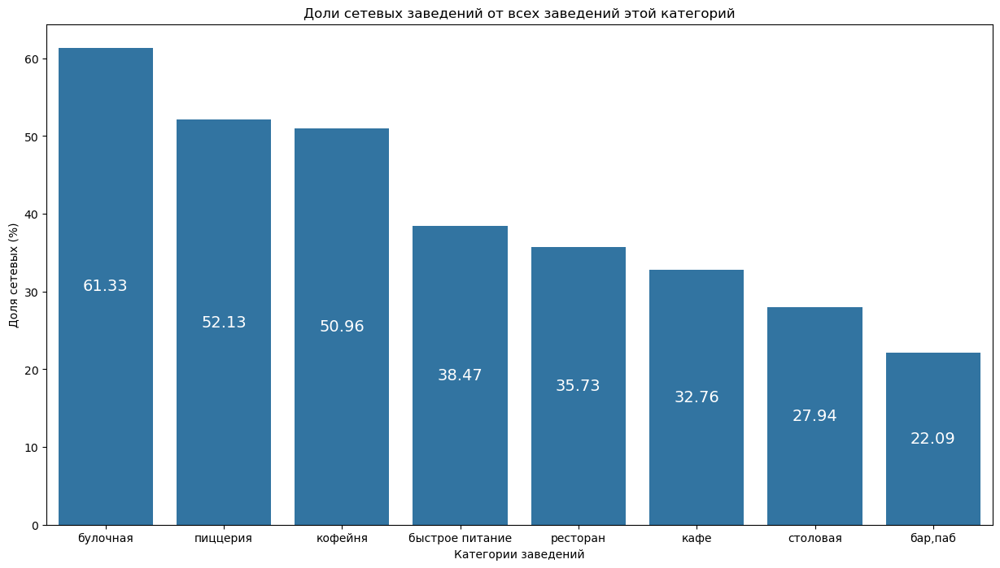

In [24]:
ax = sns.barplot(data=seti_proc.sort_values(by='proc', ascending=False), 
            x='cat', y='proc', color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=14,label_type='center', color='white')
plt.title('Доли сетевых заведений от всех заведений этой категорий')
plt.ylabel('Доля сетевых (%)')
plt.xlabel('Категории заведений')
plt.show()

Среди булочных, пиццерий и кофейн больше половины - сетевые заведения. Доля сетевых наименьшая среди баров.

<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №1__

Немного не так, тут нужно рассчитать долю сетевых от общего количества заведений
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Переделал</div>

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

Верно, булочная и пиццерия в ТОП по кол-ву сетевых заведений
</div>

### Топ-15 популярных сетей общепита

Определим ТОП-15 самых распространных сетей общественного питания в Москве

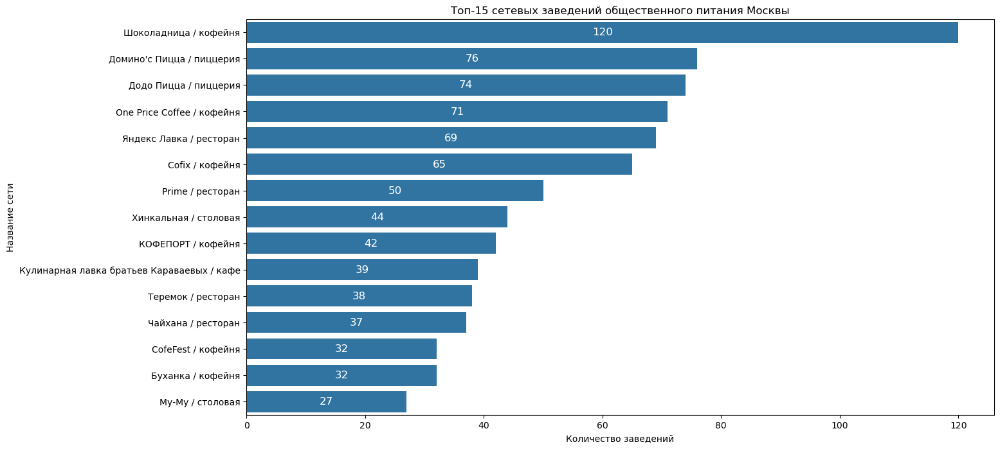

In [25]:
top15 = data.query('chain == 1').groupby('name')\
    .agg(count = ('address', 'count'), cat = ('category', 'max'))\
    .sort_values(by='count', ascending=False).head(15)

ax = sns.barplot(data=top15, x='count', y=top15.index+' / '+top15.cat, color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=12,label_type='center', color='white')
plt.title('Топ-15 сетевых заведений общественного питания Москвы')
plt.ylabel('Название сети')
plt.xlabel('Количество заведений')
plt.show()

Кофейня Шоколадница с большим отрывом опережает другие сети по растространнености. На втором и третьем месте пицерии Доминос Пицца и Додо Пицца. За ними еще одна кофейня One Price Cup и Яндекс.Лавка, которая почему то в категории "ресторан".

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Здорово, что не забыл отфильтровать по chain
</div>

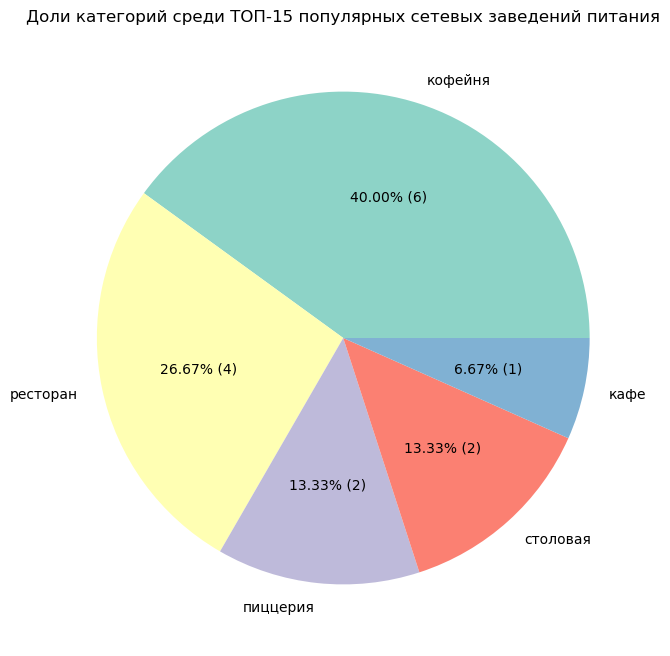

In [26]:
top15.groupby('cat')['count'].count().sort_values(ascending=False).plot.pie(ylabel='',
                #autopct='%1.1f%%',
                #pctdistance=0.8,  labeldistance=0.4,
                autopct=lambda p : '{:.2f}% ({:,.0f})'.format(p, p * len(top15)/100),
                colors=sns.color_palette('Set3') )

plt.title('Доли категорий среди ТОП-15 популярных сетевых заведений питания')
plt.show()

В целом в ТОП-15 популярных сетей вошли кофейни, рестораны, пиццерии, столовые и кафе. Причем кофейных сетей больше всего. На втором месте рестораны, затем пиццерии и столовые.

### Заведения по административным округам

Исследуем, какие административные округа Москвы присутствуют в датасете, сколько в каждом из них находится заведений общественного питания, как они распределены по категориям

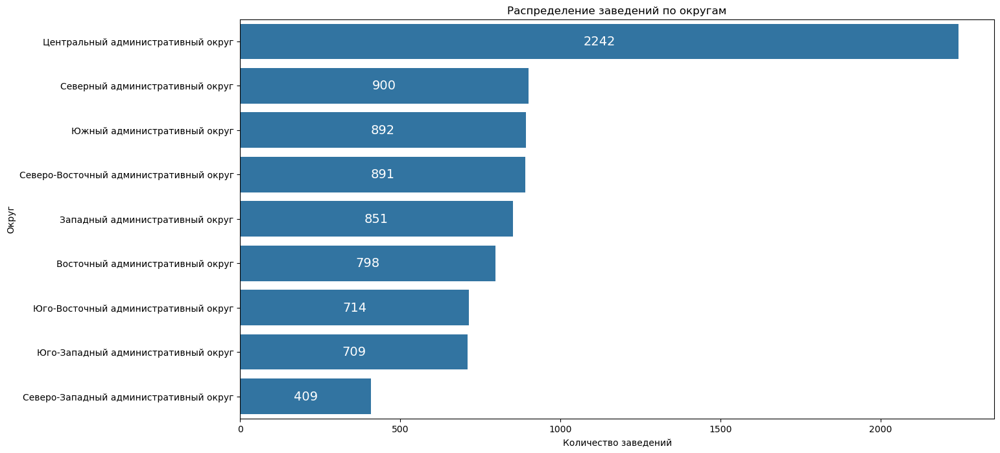

In [27]:
ax = sns.barplot(data=data.groupby('district', as_index=False)\
            .agg(count=('name', 'count')).sort_values(by='count', ascending=False), 
            x='count', y='district', color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=14,label_type='center', color='white')
plt.title('Распределение заведений по округам')
plt.ylabel('Округ')
plt.xlabel('Количество заведений')
plt.show()

В датасете 9 административных округов Москвы. Наибольшее с большим отрывом количество заведений в Центральном административном округе. Далее идут Северный Южный и Свеверо-восточный административные округи.

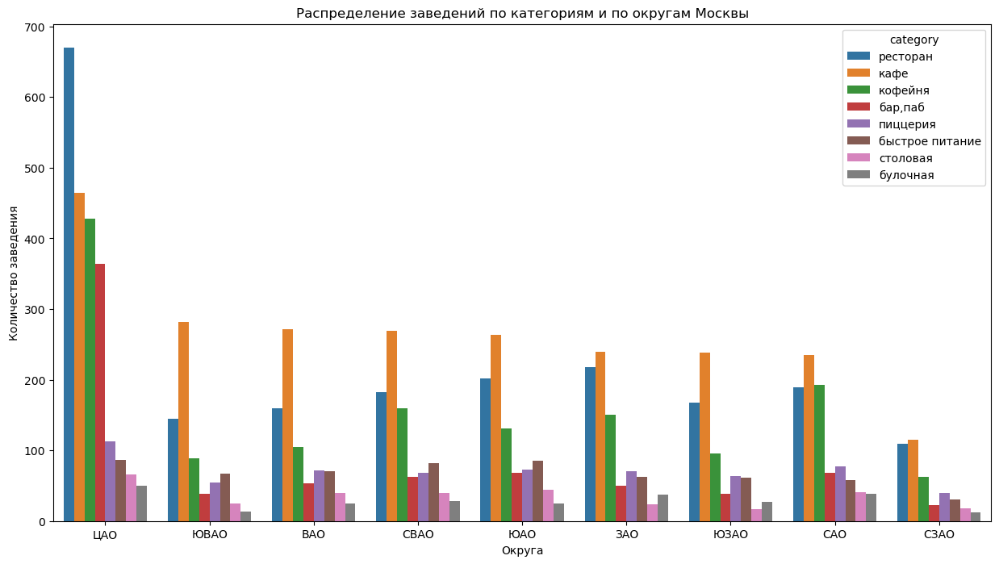

In [28]:
sns.barplot(data=data.groupby(['distr','category'], as_index=False)['name'].count()\
    .sort_values(by='name', ascending=False),
    y='name', x='distr', hue='category')
plt.title('Распределение заведений по категориям и по округам Москвы')
plt.ylabel('Количество заведения')
plt.xlabel('Округа')
plt.show()

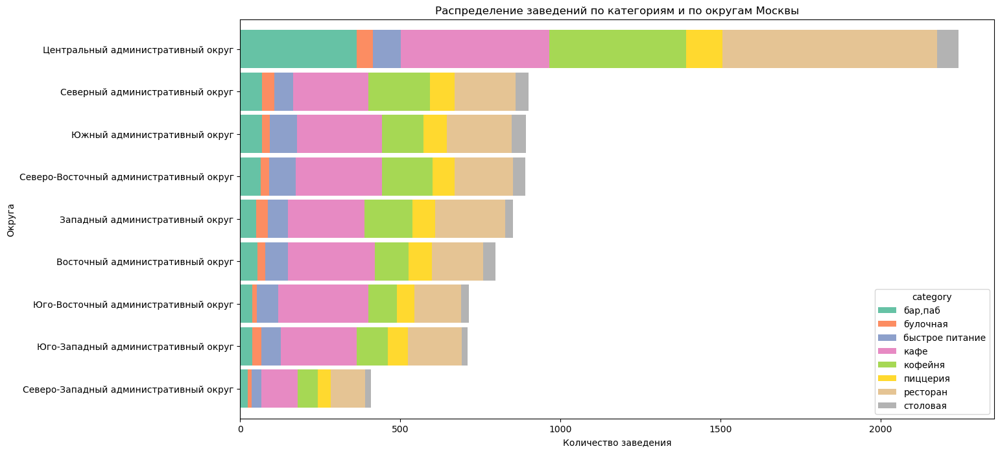

In [29]:
piv_dd = data.groupby(['district','category'], as_index=False)['name'].count().sort_values(by='name')\
        .pivot(values='name', index='district', columns='category')
piv_dd['sum'] = piv_dd.sum(axis = 1)
piv_dd.sort_values(by='sum').drop('sum', axis=1).plot(kind='barh', stacked=True, width=0.9, color=sns.color_palette('Set2') )
plt.title('Распределение заведений по категориям и по округам Москвы')
plt.ylabel('Округа')
plt.xlabel('Количество заведения')
plt.show()

<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №1__

Выбор данного графика не является оптимальным, так как его трудно интерпретировать, а сравнение между районами не очень удобно.

Рекомендую использовать следующий тип столбчатой диаграммы для улучшения читаемости данных.
    
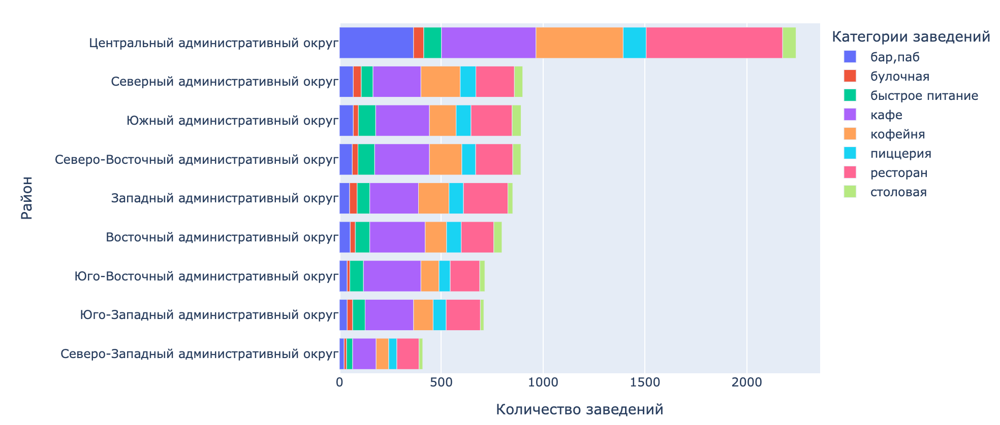
    
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Сделал другой график. НО тут я бы тоже поспорил, особенно на счет удобства сравнения по районам. По stack-графику вообще не возможно сравнить, где больше кафе в САО или ЗАО, потому что блоки категорий внутри столбца отдельного округа начинаются с разных значений, а в моем графике они все начинаются с 0. Может не удобно, но видно, в каком районе больше заведений различных категорий. Суммарное количество заведений по округам было отображено на предыдушем графике. Оставлю оба типа графиков.</div>

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

В первом случае сравнение между районам тяжело воспринимаемо, поскольку приходится каждый раз сопостовлять цветовую палитру с легендой

В целом по округам лидируют категории кафе, ресторанов и кофейни. Только в ЦАО на первом место вырывются рестораны. Также в этом раойне растространы бары,пабы.

### Рейтинги заведений по категориям

Исследуем средние рейтинги по категориям заведений общественного питания Москвы

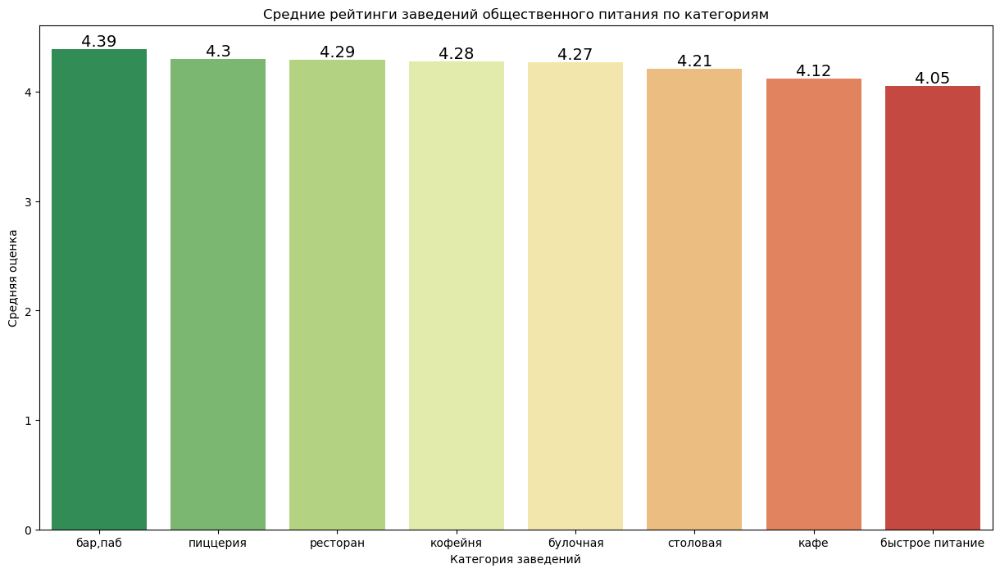

In [30]:
ax = sns.barplot(data=data.groupby('category', as_index=False).\
            agg(rating=('rating', 'mean')).round(2).sort_values(by='rating', ascending=False), 
            y='rating', x='category', palette='RdYlGn_r')
ax.bar_label(ax.containers[0], fontsize=14)

plt.title('Средние рейтинги заведений общественного питания по категориям')
plt.ylabel('Средняя оценка')
plt.xlabel('Категория заведений')
plt.show()

Cредние рейтинги по категориям заведений не сильно отличаются и находятся в пределах 4-4.4 балла. Наибольшие оценки и баров, пиццерий, ресторанов. Кафе и заведения быстрого питания - отстают, но все равно имеют средние оценки более 4 баллов.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Верно,  брать медиану по фиксированным значениями от 1 до 5 - нецелесообразно.
</div>

### Картограмма со средним рейтингом заведений

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого округа Москвы

In [31]:
rating = data.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating', ascending=False)

In [32]:
#загружаем границы округов Москвы
try: 
    with open('d:/practicum/11sprint/admin_level_geomap.geojson', 'r', encoding="utf8") as f: 
        geo_json = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson', 'r', encoding="utf8") as f: 
        geo_json = json.load(f)

#центр Москвы для карты
moscow_lat, moscow_lng = 55.751244, 37.618423

map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=geo_json,
    data=rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdYlGn',
    fill_opacity=0.8,
    legend_name='Рейтинг заведений по округам',
).add_to(map)
map

Самые высокие рейтинг заведений в Центральном ОА, а самsе низкие в Северо-Восточном и Юго-Восточном округе

### Все заведения датасета на карте

Построим карту со всеми заведениями общественного питания Москвы из датасета

In [33]:
map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

marker_cluster = MarkerCluster().add_to(map)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

map

Карта показывает плотность заведений общественного питания

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Отлично, хороплет освоен
</div>

### Топ-15 улиц по количеству заведений

Определим ТОП-15 улиц, на которых размещается больше всего заведений общественного питания, исследуем распределение количества заведений по категориям для этим улиц.

In [34]:
top_street = data.groupby('street', as_index=False).agg(count=('name', 'count')).\
    sort_values(by='count', ascending=False).head(15)

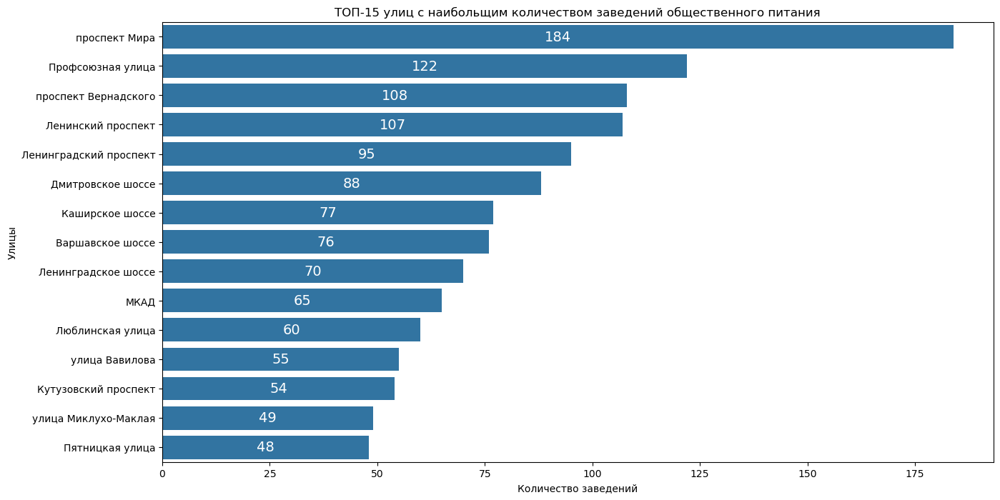

In [35]:
ax = sns.barplot(data = top_street, x="count", y="street", color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=14, label_type='center', color='white')
plt.title('ТОП-15 улиц с наибольщим количеством заведений общественного питания')
plt.ylabel('Улицы')
plt.xlabel('Количество заведений')
plt.show()

График распределения количества заведений и их категорий по этим улицам

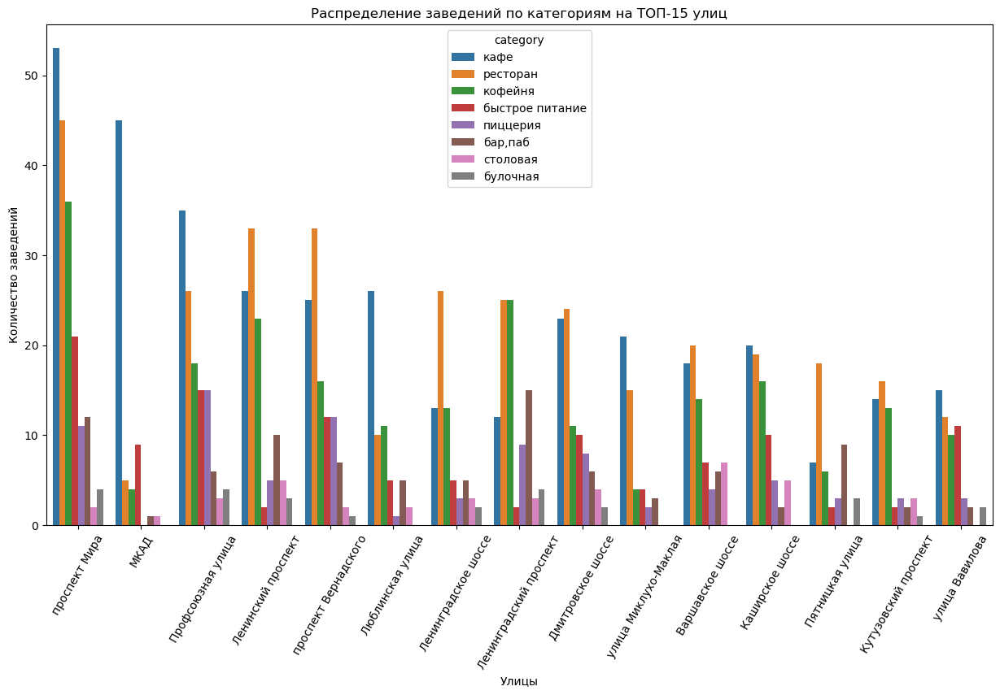

In [36]:
sns.barplot(data=data.query('street in @top_street.street').groupby(['street','category'], as_index=False).agg(count=('name', 'count'))\
            .sort_values(by='count', ascending=False)
            , y='count', x='street', hue='category')
plt.xticks(rotation=60)
plt.title('Распределение заведений по категориям на ТОП-15 улиц')
plt.ylabel('Количество заведений')
plt.xlabel('Улицы')
plt.show()

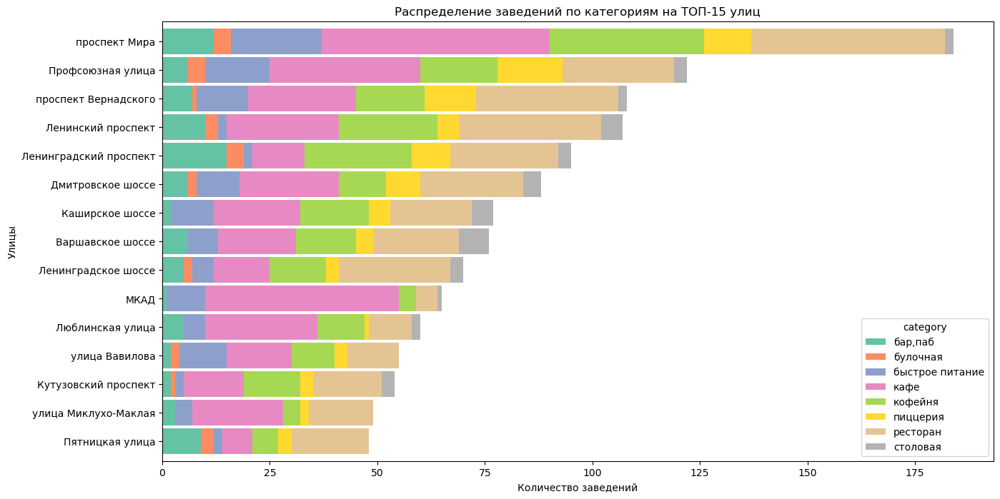

In [37]:
piv_dd = data.query('street in @top_street.street').groupby(['street','category'], as_index=False)['name'].count().sort_values(by='name')\
        .pivot(values='name', index='street', columns='category')
piv_dd['sum'] = piv_dd.sum(axis = 1)
piv_dd.sort_values(by='sum').drop('sum', axis=1).plot(kind='barh', stacked=True, width=0.9, color=sns.color_palette('Set2') )
plt.title('Распределение заведений по категориям на ТОП-15 улиц')
plt.ylabel('Улицы')
plt.xlabel('Количество заведений')
plt.show()

<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №1__

    
Тут аналогично по типу графика

<div class="alert alert-info"> <b>Комментарии студента:</b> Добавил другой тип графика</div>

В целом на улицах ТОП-15 больше всего расположено кафе, ресторанов и кофейн. Больше всего заведений на проспекте Мира, наверно, потому что он очень длинный. На МКАД много кафе и точек быстрого питания - быстро перекусить и дальше в путь. Интересно, что баров больше всего Ленинском и Ленинградском проспекте, а также на Пятницкой улице. На этих же улицах, а также проспекте Вернадского по количеству заведений рестораны обходят кафе.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

Согласен с полученными результатами, что не удивительно, ведь проспект Мира одна из самых больших и популярных улиц столицы
</div>

### Улицы, на которых только одно заведение общепита

Определим улицы, на которых находится только один объект общепита

In [38]:
one_obj = data.groupby('street', as_index=False).agg(count=('name', 'count')).query('count == 1')
len(one_obj)

458

In [39]:
one_obj['type'] = one_obj['street'].apply(lambda x: x.split(" ")[-1])
one_obj.groupby('type')['street'].count().sort_values(ascending=False).head(10)

type
улица         108
переулок      107
проезд         48
набережная      8
тупик           7
шоссе           5
площадь         5
парк            3
линия           3
отдыха          3
Name: street, dtype: int64

В датасете 458 улиц на которых только одно заведение общественного питания. Треть из них в переулках и проездах, то есть далеко не на самых главных улицах города. Наверняка, это касается и остальных адресных единиц, на которых располагается только одно заведение общественного питания.

### Средние чеки заведений общепита

Перед анализом сренего чека, прежде всего, учитываем, что в колонке middle_avg_bill 63% пропусков. Оценим разброс имеющихся данных

In [40]:
data['middle_avg_bill'].describe()

count    3149.00
mean      958.05
std      1009.73
min         0.00
25%       375.00
50%       750.00
75%      1250.00
max     35000.00
Name: middle_avg_bill, dtype: float64

Медианный чек - 750, средний - 958, максимлаьное значение - 35 тысяч рублей. Для некоторых заведений Москвы, наверно, средний чек  в 35 тысяч рублей, вполне может быть. Чтобы исключить влияние этих единичтных заведений для дальнейших исследований возьмем медиану средних чеков.

Построим фоновую картограмму (хороплет) медианных значений средних чеков заведений общественного питания по округам Москвы. Исследуем влияние округа и удаленности от центра на цены в заведениях

In [41]:
avg_bill = data.groupby('district', as_index=False)['middle_avg_bill'].median()\
        .sort_values(by='middle_avg_bill', ascending=False)

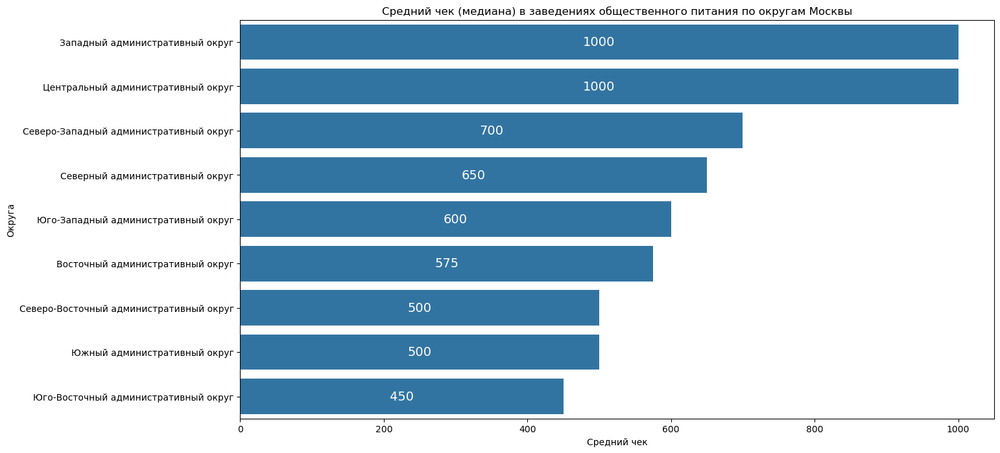

In [42]:
ax = sns.barplot(data = avg_bill, x="middle_avg_bill", y="district", color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=14,label_type='center', color='white')
plt.title('Средний чек (медиана) в заведениях общественного питания по округам Москвы')
plt.ylabel('Округа')
plt.xlabel('Средний чек')
plt.show()

In [43]:
map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdYlGn_r',
    fill_opacity=0.5,
    legend_name='Средний чек в заведениях по округам',
).add_to(map)
map

В Центральном и Западный административный округе самые высокие средние чеки. В Южном и Юго-Восточном административном округе средние чеки практически в 2 раза меньше. Даже на такой карте видно, что чем дальше от центра - тем ниже цены в заведениях. Еще лучше эта зависимость прослеживается, если по координатам вычислить растояние от географического центра Москвы до заведений.

**Промежуточные выводы**

Выявили общие закономерности в заведениях общественного питания Москвы. Наиболее распространенных заведения общественного питания - кафе, ресторан, кофейня. Самые вместительные - рестораны, бары и кофейни. В среднем в заведениях общественного питания около 70 посадочных мест. 40% заведений - сетевые. Наибольшая доля сетевиков среди булочных, пиццерий  и кофейн. Наибольшее количество заведений территориально находятся в Центральном административном округе Москвы. Cредние рейтинги по категориям заведений не сильно отличаются. Средний (медианный) чек - 750р, причем чем дальше от центра города, тем ниже цены.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Средний чек центрального округа самый высокий, что не удивительно. Не сильно по цене уступает и Западный округ. Бюджетные заведения легче встретить ЮАО, ЮВАО и СВАО.
</div>

## Детализируем исследование: открытие кофейни

Заказчик намерен открыть крутую и доступную кофейню в Москве. Заказчик не боится конкуренции в этой сфере, понимая, что таких заведений уже достаточно много в Москве. Заказчика итересуют следующие вопросы:
- Сколько всего кофеен в датасете?
- В каких районах их больше всего?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги?
- Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии ?

Определим, сколько всего в датасете кофеен

In [44]:
all_coffee = data.query('category == "кофейня"')['name'].count()
all_coffee

1413

Почти полторы тысячи таких заведений, но стоит учитывать, что чашку кофе можно купить практически и в любом другом заведении общественного питания

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Расчёт корректый

In [45]:
print('Сетевых кофеен:',data.query('category == "кофейня" and chain == 1')['name'].count())
print('Это',round(100 * data.query('category == "кофейня" and chain == 1')['name'].count() / all_coffee,2),'% от всех кофеен')

Сетевых кофеен: 720
Это 50.96 % от всех кофеен


Половина всех кофеен сетевые - не зря же в ТОП-15 сетей сразу 6 кофеен.

### Распределение кофейн по округам Москвы

Исследуем распределение кофейн по округам Москвы

In [46]:
coffe_reg = data.query('category == "кофейня"').groupby('district', as_index=False)\
    .agg(count=('name', 'count'), distr=('distr', 'max')).sort_values(by='count', ascending=False)

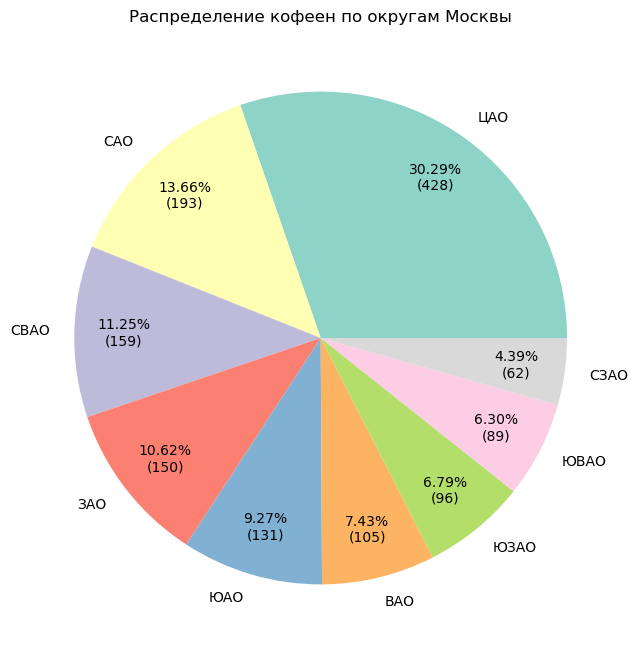

In [47]:
coffe_reg['count'].plot.pie(ylabel='', labels = coffe_reg['distr'],
                pctdistance=0.8, # labeldistance=0.4,
                autopct=lambda p : '{:.2f}%\n({:,.0f})'.format(p, p * coffe_reg['count'].sum()/100),
                colors=sns.color_palette('Set3') )
plt.title('Распределение кофеен по округам Москвы')
plt.show()

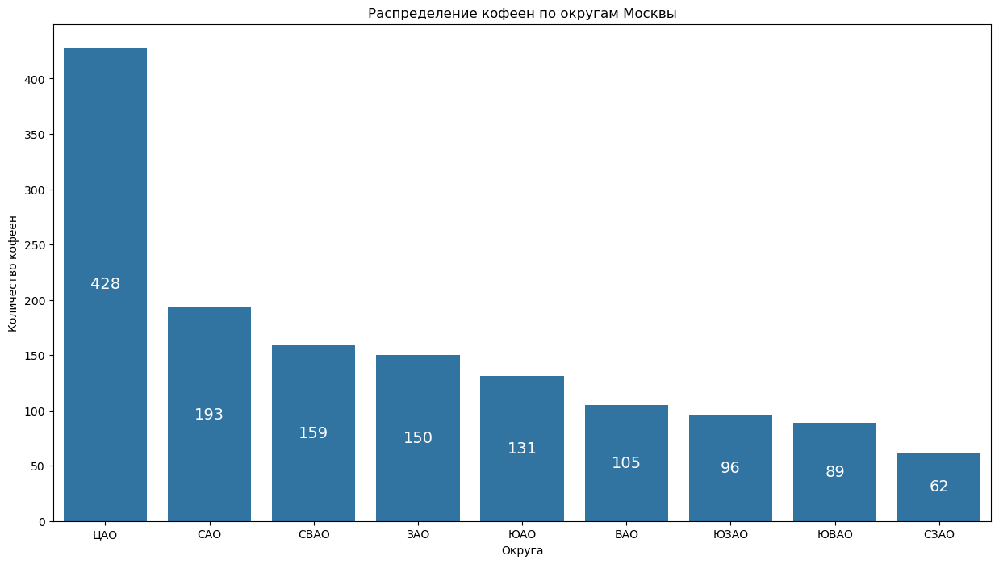

In [48]:
ax = sns.barplot(data = coffe_reg, y='count', x='distr', color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=14,label_type='center', color='white')
plt.title('Распределение кофеен по округам Москвы')
plt.ylabel('Количество кофеен')
plt.xlabel('Округа')
plt.show()

In [49]:
map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=coffe_reg,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='RdYlGn_r',
    fill_opacity=0.5,
    legend_name='Количество кофеен',
).add_to(map)
map

Больше всего кофеен в Центральном административном округе, меньше всего на Северо-Западе

### Среднее число посадочных мест в кофейнях

In [50]:
data.query('category == "кофейня"')['seats'].median()

80.0

В среднем в кофейнях 80 посадочных мест

### Кофейни, работающие по одному адресу

In [51]:
coffe_one_address = data.query('category == "кофейня"').groupby('address', as_index=False)\
    .agg(count=('name', 'count')).query('count > 1').sort_values(by='count', ascending=False)
coffe_one_address['count'].sum()

339

Более 300 кофеен работают по одному адресу. Скорее всего, это торговые центры.

### Круглосуточные кофейни

Определим, сколько кофеен работает в круглосуточном режиме

In [52]:
print('Круглосуточных кофеен:',data.query('category == "кофейня" and is_24_7')['name'].count())
print('Это',round(100 * data.query('category == "кофейня" and is_24_7')['name'].count() / all_coffee,2),'% от всех кофеен')

Круглосуточных кофеен: 59
Это 4.18 % от всех кофеен


Распределение круглосуточных кофеен по округам Москвы

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Всё верно

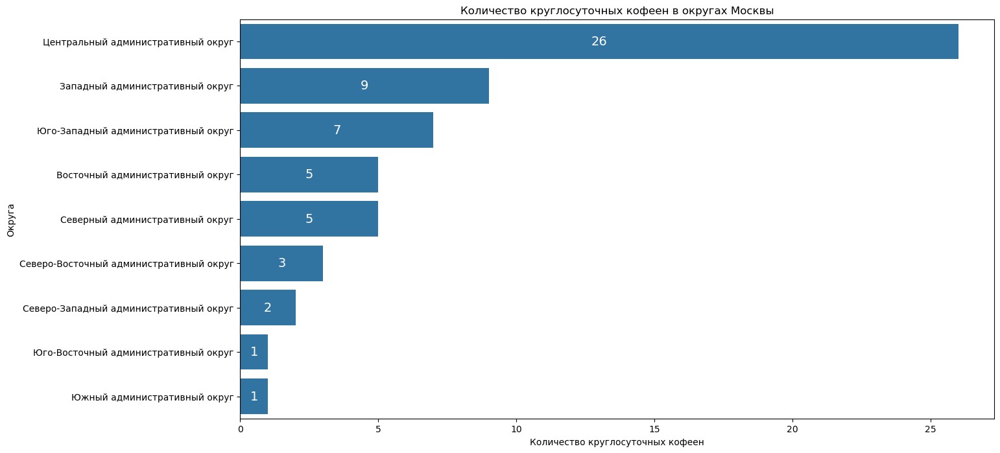

In [53]:
coffe_247_reg = data.query('category == "кофейня" and is_24_7').groupby('district', as_index=False)\
    .agg(count=('name', 'count')).sort_values(by='count', ascending=False)

ax = sns.barplot(data = coffe_247_reg, x="count", y="district", color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=14,label_type='center', color='white')
plt.title('Количество круглосуточных кофеен в округах Москвы')
plt.ylabel('Округа')
plt.xlabel('Количество круглосуточных кофеен')
plt.show()

Круглосуточных кофеен вцелом мало, а в Юго-Восточном и Южном округе их всего по одной. Наверняка, в этих округах попить кофе в 6 утра можно и в простых кафе или точных быстрого питания, но специализированного заведения явно не хвататет.

### Средний рейтинг кофеен

Определим средний рейтинг всех кофеен

In [54]:
data.query('category == "кофейня"')['rating'].mean().round(2)

4.28

Исследуем распределение райтингом кофеен по округам Москвы

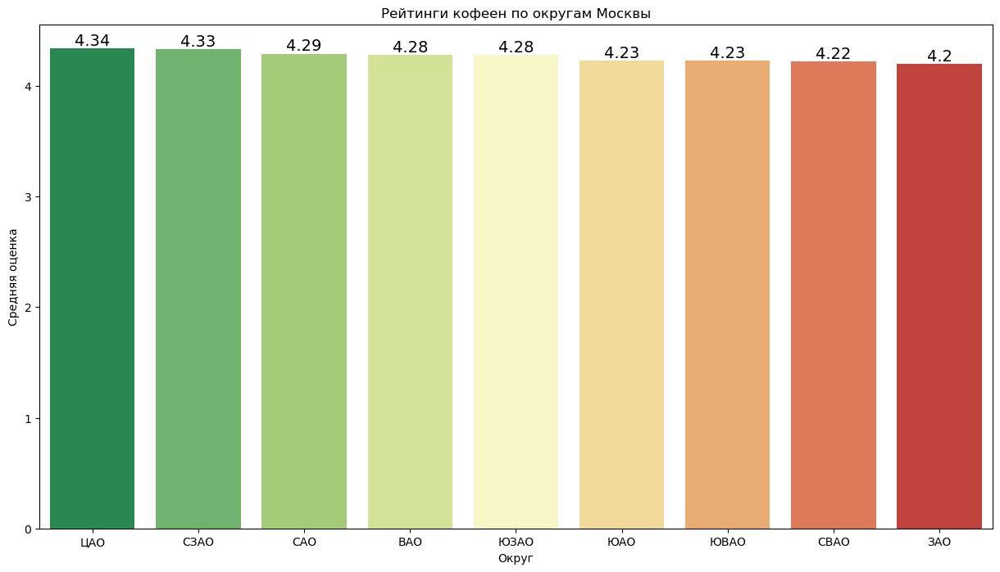

In [55]:
ax = sns.barplot(data = data.query('category == "кофейня"').groupby('distr', as_index=False)\
    .agg(rating=('rating', 'mean')).round(2).sort_values(by='rating', ascending=False)
                 , y="rating", x="distr", palette='RdYlGn_r')
ax.bar_label(ax.containers[0], fontsize=14, color='Black')
plt.title('Рейтинги кофеен по округам Москвы')
plt.ylabel('Средняя оценка')
plt.xlabel('Округ')
plt.show()

Рейтинги кофеен в диапазоне 4.2-4.35, не сильно отличаются по округам. Наибольший в Центральном округе, наименьший в Западном.

### Средняя стоимость одной чашки кофе

Определим средную стоимость одной чашки кофе. Стоит отметить, что в датасете представлены цена далеко не из всех кофеен

In [56]:
print('Кофейни, для которых неизвестны цены чашки кофе:',data.query('category == "кофейня"')['middle_coffee_cup'].isna().sum())
print('Это',round(100 * data.query('category == "кофейня"')['middle_coffee_cup'].isna().sum() / all_coffee,2),'% от всех кофеен')

Кофейни, для которых неизвестны цены чашки кофе: 892
Это 63.13 % от всех кофеен


Для почти 900 кофеен (63%) нет данных о среднем чеке. Дальнешее исследование основано на данных только 37% кофеен из датасета.

In [57]:
data.query('category == "кофейня"')['middle_coffee_cup'].describe()

count    521.00
mean     175.06
std       89.75
min       60.00
25%      124.00
50%      170.00
75%      225.00
max     1568.00
Name: middle_coffee_cup, dtype: float64

Медианная цена чашки  кофе - 175 рублей, средняя - 170. Максимадлное значение - 1568.

In [58]:
data.query('category == "кофейня" and middle_coffee_cup > 500')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,distr
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.78,37.71,4.20,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.00,1,48.00,Большая Семёновская улица,False,ВАО


Это единичный выброс в данных, которые дает небольшую погрешность в средние значения. Можно отфильтровать его, либо использовать для анализа медианные значения.

Исследуем распределение средней цены чашки кофе по округам Москвы

In [59]:
coffe_bill = data.query('category == "кофейня"  and middle_coffee_cup < 500').groupby('district', as_index=False)\
    .agg(distr=('distr', 'max'), mean_bill=('middle_coffee_cup', 'mean'), median_bill=('middle_coffee_cup', 'median'))\
    .sort_values(by='median_bill', ascending=False)

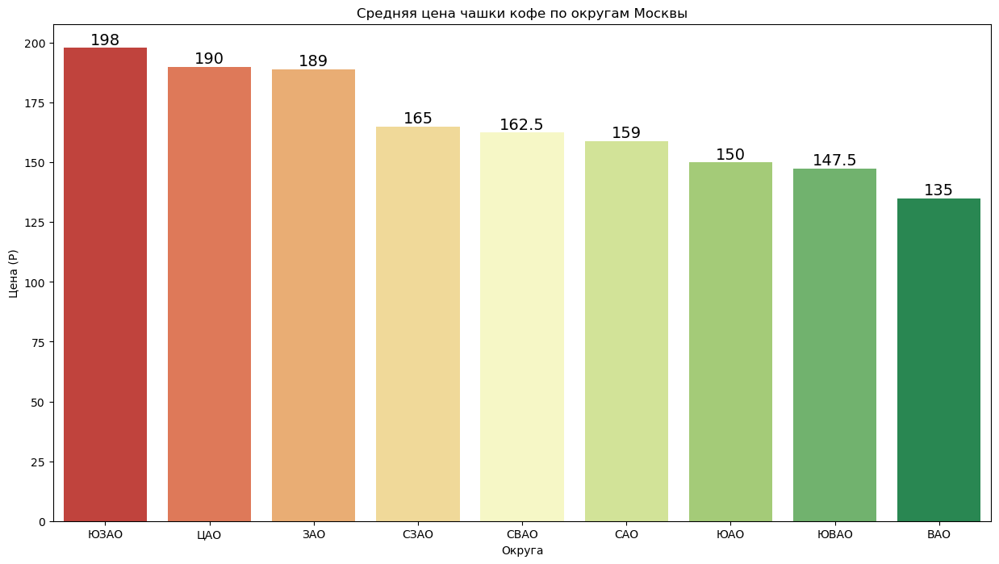

In [60]:
ax = sns.barplot(data=coffe_bill, y="median_bill", x="distr", palette='RdYlGn')
ax.bar_label(ax.containers[0], fontsize=14, label_type='edge')
plt.title('Средняя цена чашки кофе по округам Москвы')
plt.ylabel('Цена (Р)')
plt.xlabel('Округа')
plt.show()

In [61]:
map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=coffe_bill,
    columns=['district', 'median_bill'],
    key_on='feature.name',
    fill_color='RdYlGn_r',
    fill_opacity=0.5,
    legend_name='Средняя стоимость чашки кофе по округам',
).add_to(map)
map

Самые дорогой кофе в Юго-Западном и Центральном округе Москвы, а самый дешевый - в Восточном и Юго-Восточном округах. Причем разница в 30%, поэтому при открытии кофейни лучше ориентироваться на цены в округе, а не в целом по Москве.

### Карта со всеми имеющимися кофейнями

Построим карту Москвы со всеми имеющимися в датасете кофейнями

In [62]:
map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

marker_cluster = MarkerCluster().add_to(map)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    if not math.isnan(row['middle_coffee_cup']): price = ', 1cup '+str(row['middle_coffee_cup'])+'₽'
    else: price = ''
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}, {row['address']}, R{row['rating']}"+price,
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.query('category == "кофейня"').apply(create_clusters, axis=1)

# выводим карту
map

Если навести на маркер, то в всплывающей подсказке будеь название кофейни, адрес, рейтинг и цена одной чашки, если она указана в датасете.

### Тепловая карта средних цен чашки кофе в кофейнях Москвы

In [63]:
coffe_price = data.query('category=="кофейня" and middle_coffee_cup < 400 and middle_coffee_cup.notnull()')

lats_longs = []
for row in coffe_price.iterrows():
    #print(row[1]['lat'])
    lats_longs.append([row[1]['lat'], row[1]['lng'], row[1]['middle_coffee_cup']])
    
map_obj = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

marker_cluster = MarkerCluster().add_to(map_obj)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']},\n {row['address']}, R{row['rating']}, 1cup {row['middle_coffee_cup']}₽",
        min_width=450
    ).add_to(marker_cluster)

coffe_price.apply(create_clusters, axis=1)

HeatMap(lats_longs).add_to(map_obj)

colormap = branca.colormap.LinearColormap(['blue', 'lime', 'red'], vmin=coffe_price['middle_coffee_cup'].min(),
            vmax=coffe_price['middle_coffee_cup'].max(), caption='Средняя стоимость чашки кофе')
colormap.add_to(map_obj)

map_obj


**Промежуточные выводы**

Детальное исследование кофейни показало, что это одна из самых распространенных категорий заведений общественного питания Москвы. Половина всех кофеен - сетевые. Круглосуточная кофеен меньше 5%. Наибольщее число кофеен в Центральном округе. Средний рейтинг кофейн примерно одинаковый по округам - 4.3. А вот средняя цена одной чашки кофе сушественно отличается между районами.

## Общий вывод

Исследование данных датасета заведений общественного питания Москвы привело к следующим выводам:

Наиболее распространенных заведения общественного питания - кафе, ресторан, кофейня. В среднем в заведениях общественного питания около 70 посадочных мест. Самые вместительные - рестораны, бары и кофейни. 40% заведений - сетевые, причем наибольшая додя сетевиков среди булочных. В ТОП-15 сетевых заведений сразу 6 кофеин, а самая распространненая сеть опять же кофейня "Шоколадница". 

Наибольшее количество заведений территориально находятся в Центральном административном округе Москвы. В целом по округам лидируют все те же кафе, ресторанов и кофейни. В ТОП-15 улиц с наибольшим количеством заведений также больше всего расположено кафе, ресторанов и кофейн. 

Cредние рейтинги по категориям заведений не сильно отличаются и находятся в пределах 4-4.4 балла. Средний (медианный) чек - 750р, причем чем дальше от центра города, тем ниже цены.

**Рекомендации заказчикам**

Если заказчик не боится конкуренции, то можно открыть кофейню в центральном округе. Похоже, это 100% вариант - там самые высокие цены, при этом больше всего кофеен. Наверняка, все проходимые места уже заняты, привлекать клиентов придется особой концепцией кофейни.

Также рекомендуем присмотреться к Западному и Юго-Западному округам. Цены на кофе там столь же высокие, как и в центральной части Москвы, но при этом только 17% кофеен расположены в этих округах.

Ниша круглосуточных кофеен, кажется, вообще свободна. В Южном и Юго-Восточном округе всего по одной круглосуточной кофейне. Правда, и цены там одни из самых низких.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Итоговый вывод завершает твое исследование. Представлены основные результаты полученные в ходе анализа, но самое главное - даны рекомендации заказчику. Это важное качество для аналитика. Развивай его и дальше
</div>

Презентация: https://disk.yandex.ru/i/s_CLIjXX4MFTAg

<div class="alert alert-block alert-warning">📝
Комментарий от ревьюера №1 </b> 

---
У тебя получилась очень сильная и хорошая работа. Здорово, что расчеты ты сопровождаешь иллюстрациями, а так же не забываешь про комментарии, твой проект интересно проверять. 

---

***Нужно поправить:***


1) Типы графиков

2) Распределение посадочных мест

3) Доля сетевых от общего количества заведений

4) Поправить выводы и презентацию после корректировки


---


***Презентация сделана хорошо, особенно порадовало:***

* её структурность

* Один слайд-одна мысль. Идеально =) 😊 

* последовательность

* рекомендации

***Как её нужно улучшить:***


* Автор исследования
* Нумерация слайдов


Давай поправим мои основные комментарии и будем двигаться дальше.

---

У Яндекс Практикума есть отличный и бесплатный курс по презентациям. Советую, в свободное время освоить его (https://practicum.yandex.ru/profile/visual-presentation/)


---


Если у тебя будут какие-то вопросы по моим комментариям - обязательно пиши! Буду ждать работу на повторное ревью :)</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Если не поправил, то добавил что требовалось</div>

<div style="border:solid blue 3px; padding: 20px">
<div class="alert alert-block alert-success">✔️
    

__Коментарий от ревьюера №2__


    
В остальном всё чудно😊. Твой проект так и просится на github =)   
    
Поздравляю с успешным завершением проекта 😊👍
И желаю успехов в новых работах 😊

---

От себя хочу порекомендовать тебе отличный метериал про визуализации данных. 
    
* **Книга Графики, которые убеждают всех | А. Богачев**
    
* **Курс по созданию презентаций для специалистов цифровых профессий (free): 
Курс по созданию презентаций для специалистов цифровых профессий (free): https://practicum.yandex.ru/visual-presentation/**
    